# Implementation of Conditional GAN on Fashion MNIST dataset

## Preparing the Dataset

In [3]:
from tensorflow.keras.models import Model, save_model, load_model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, Dropout, Flatten, Dense, Reshape, Input, Embedding, Concatenate
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy

import numpy as np

from matplotlib import pyplot as plt

In [8]:
#loading Fashion MNIST dataset
from keras.datasets.fashion_mnist import load_data
(real_train_images, real_train_labels), (real_test_images, real_test_labels) = load_data()
# shape of dataset
print('Train', real_train_images.shape, real_train_labels.shape)
print('Test', real_test_images.shape, real_test_labels.shape)

Train (60000, 28, 28) (60000,)
Test (10000, 28, 28) (10000,)


Defining some parameters

In [10]:
#input shape of Fashion MNIST data images
INPUT_SHAPE = (28, 28, 1)

#number of classes
N_CLASSES = 10

#label values for real and fake images
REAL_LABEL_VALUE = 1
FAKE_LABEL_VALUE = 0

#dimension of latent/noise vector
NOISE_DIM = 100

#size of the label embedding layer
LABEL_EMBEDDING_SIZE = 50

LATENT_LOW_RES_VALUE = 7
LATENT_SCALAR = 128
LATENT_DENSE_SIZE = LATENT_SCALAR * LATENT_LOW_RES_VALUE * LATENT_LOW_RES_VALUE
GENERATOR_INITIAL_SHAPE = (LATENT_LOW_RES_VALUE, LATENT_LOW_RES_VALUE, LATENT_SCALAR)

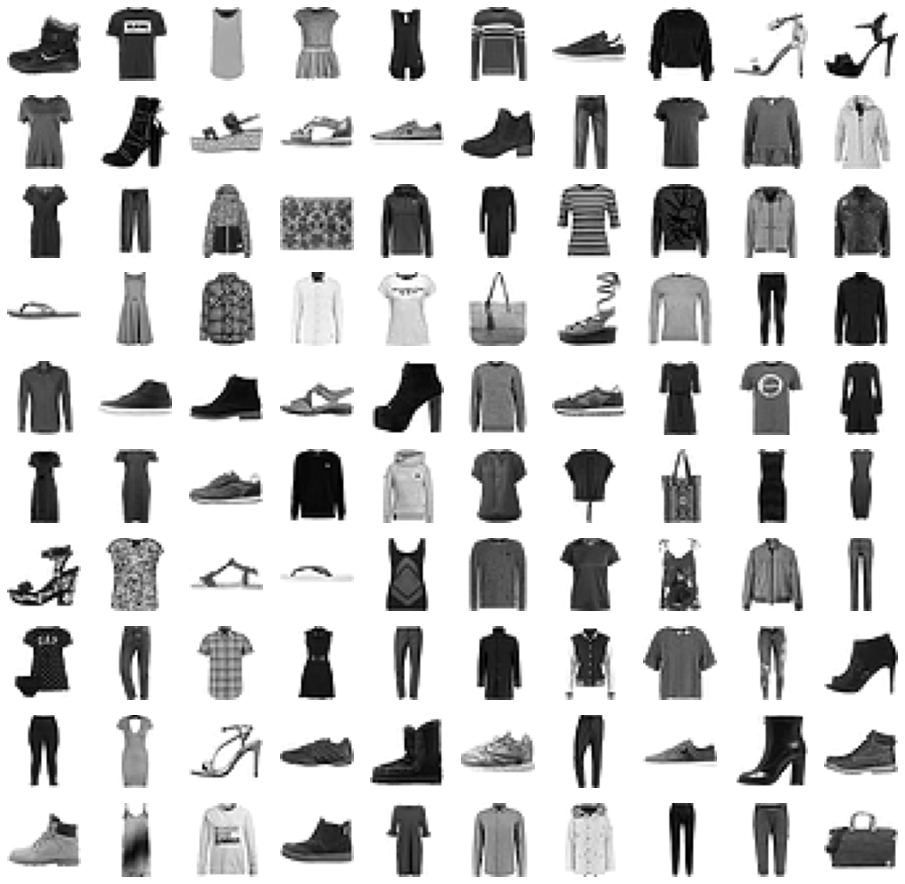

In [11]:
#plotting some training images
fig = plt.figure()
fig.set_size_inches(16,16)
for i in range(100):
    # define subplot
    plt.subplot(10, 10, 1 + i)
    # turn off axis
    plt.axis('off')
    # plot raw pixel data
    plt.imshow(real_train_images[i], cmap='gray_r')
plt.show()

In [12]:
#normalizing from [0, 255] to [-1, 1]
def prepare_real_samples(samples):
    prepared_samples = samples.astype('float32')
    prepared_samples = (prepared_samples - 127.5) / 127.5
    
    return prepared_samples

In [13]:
#selecting real samples
def generate_real_batch(samples, orig_labels, n_samples):
    indices = np.random.randint(0, samples.shape[0], n_samples)
    batch_images = samples[indices]
    
    batch_orig_labels = orig_labels[indices]
    batch_labels = np.full(n_samples, REAL_LABEL_VALUE)

    return batch_images, batch_labels, batch_orig_labels.flatten()

In [2]:
#geneerating random noise and class as input of the generator
def generate_noise_vector(noise_dim, n_samples, n_classes):
    noise_vector = np.random.normal(size = (n_samples, noise_dim))

    return noise_vector, np.random.randint(0, n_classes, size = n_samples)

#selecting fake samples
def generate_fake_batch(generator, noise_dim, n_classes, n_samples):
    noise_vector, original_classes = generate_noise_vector(noise_dim, n_samples, n_classes)
    
    batch_images = generator.predict([noise_vector, original_classes])
    batch_labels = np.full(n_samples, FAKE_LABEL_VALUE)
    
    return batch_images, batch_labels, original_classes

(2, 1)
(6, 1)
(7, 1)
(6, 1)
(2, 1)
(4, 1)
(6, 1)
(8, 1)
(2, 1)
(6, 1)


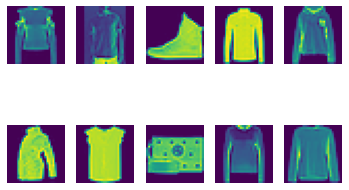

In [14]:
#preparing the dataset
prepared_real_images = prepare_real_samples(real_train_images)

#visualizing the data
real_x, label, orig_label = generate_real_batch(prepared_real_images, real_train_labels, 10)

for l in zip(orig_label, label):
    print(l)

real_x = (real_x + 1) / 2

for i in range(10):
    ax = plt.subplot(2, 5, i+1)
    ax.axis('off')
    plt.imshow(real_x[i])
plt.show()

## Defining the discriminator, generator and the conditional GAN model

In [15]:
#defining the discriminator model
def create_discriminator(in_shape=(28, 28, 1), n_classes=10, label_smoothing=0):

    label_input = Input(shape=(1,))

    embedding_input = Embedding(n_classes, LABEL_EMBEDDING_SIZE)(label_input)

    embedding_input = Dense(in_shape[0] * in_shape[1])(embedding_input)
    embedding_input = Reshape((in_shape[0], in_shape[1], 1))(embedding_input) 
    image_input = Input(shape=in_shape)
    merge = Concatenate()([image_input, embedding_input])
   
    feature_extractor = Conv2D(128, (3,3), strides=(2, 2), padding='same')(merge)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)
    
   
    feature_extractor = Conv2D(128, (3,3), strides=(2, 2), padding='same')(feature_extractor)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)

    
    feature_extractor = Flatten()(feature_extractor)
    feature_extractor = Dropout(0.4)(feature_extractor)
    
    out_layer = Dense(1, activation='sigmoid')(feature_extractor)

   
    model = Model([image_input, label_input], out_layer)
    opt = Adam(learning_rate = 0.0002, beta_1=.5)
    loss = BinaryCrossentropy(label_smoothing=label_smoothing)
    model.compile(loss=loss, optimizer=opt, metrics=['accuracy'])
    
    return model


Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 1, 50)        500         input_1[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 1, 784)       39984       embedding[0][0]                  
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 28, 28, 1)]  0                                            
_______________________________________________________________________________________

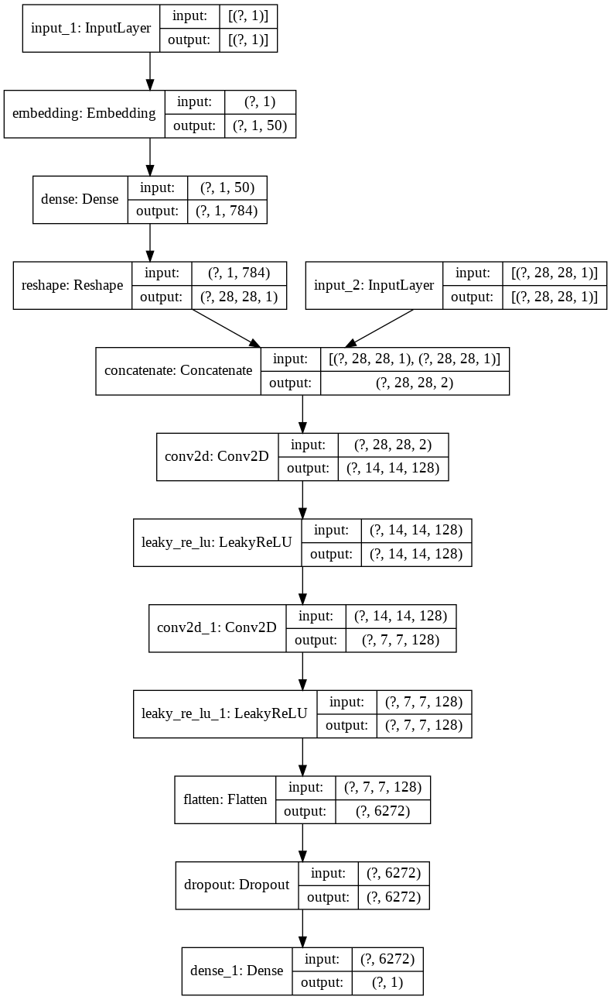

In [16]:
discriminator = create_discriminator(INPUT_SHAPE, N_CLASSES)
discriminator.summary()
plot_model(discriminator, to_file='discriminator_plot.png', show_shapes=True, show_layer_names=True)

In [17]:
#defining the generator model
def create_generator(noise_dim = 100, dense_layer_nodes = LATENT_DENSE_SIZE, n_classes = 10):
    
    label_input = Input(shape=(1,))
    embedding_input = Embedding(n_classes, LABEL_EMBEDDING_SIZE)(label_input)
    embedding_input = Dense(LATENT_LOW_RES_VALUE * LATENT_LOW_RES_VALUE)(embedding_input)
    embedding_input = Reshape((LATENT_LOW_RES_VALUE, LATENT_LOW_RES_VALUE, 1))(embedding_input)


    latent_input = Input(shape=(noise_dim,))
    noise_input = Dense(dense_layer_nodes)(latent_input)
    noise_input = LeakyReLU(alpha=0.2)(noise_input)
    noise_input = Reshape(GENERATOR_INITIAL_SHAPE)(noise_input)

    merge = Concatenate()([noise_input, embedding_input])
    
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(merge)
    gen = LeakyReLU(alpha=0.2)(gen)

    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen)
    gen = LeakyReLU(alpha=0.2)(gen)

    out_layer = Conv2D(1, (7, 7), activation='tanh', padding='same')(gen)

    return Model([latent_input, label_input], out_layer)

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_3 (Dense)                 (None, 6272)         633472      input_4[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 50)        500         input_3[0][0]                    
_______________________________________________________________________________________

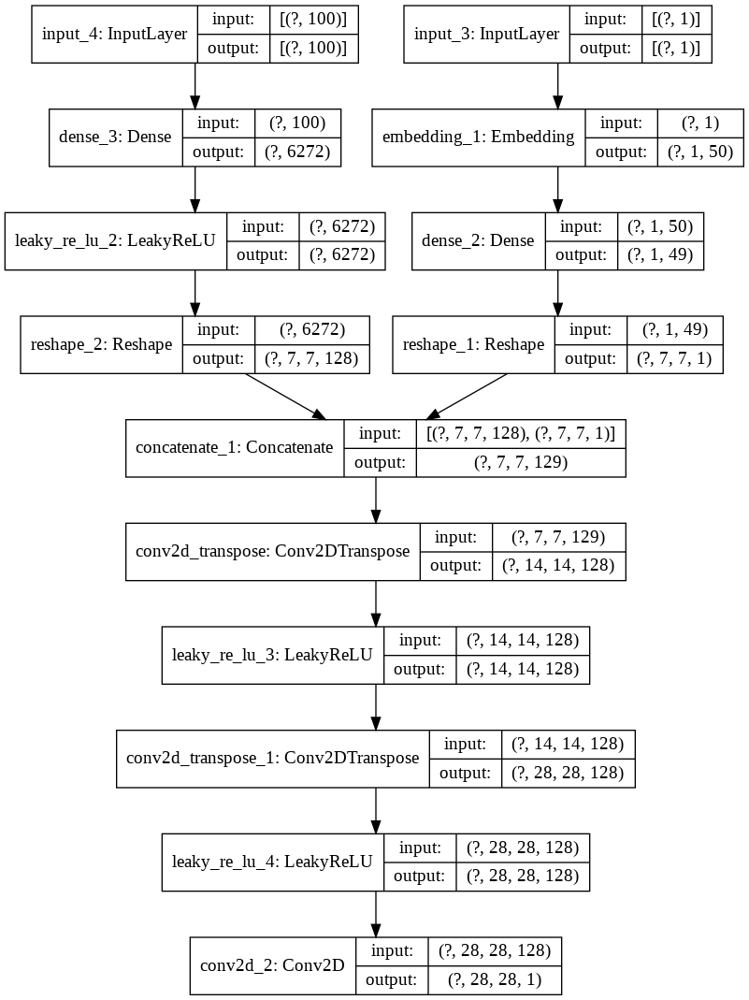

In [18]:
generator = create_generator(NOISE_DIM, LATENT_DENSE_SIZE, N_CLASSES)
generator.summary()
plot_model(generator, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

In [19]:
#combining the generator and discriminator model
def create_gan(generator_model, discriminator_model, label_smoothing=0):
    discriminator_model.trainable = False
    generator_noise, generator_embedding = generator_model.input
    generator_output = generator_model.output
    gan_output = discriminator_model([generator_output, generator_embedding])
    model = Model([generator_noise, generator_embedding], gan_output)
    opt = Adam(lr=0.0002, beta_1=0.5)
    loss = BinaryCrossentropy(label_smoothing=label_smoothing)
    model.compile(loss=loss, optimizer=opt, metrics=['accuracy'])
    return model

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 100)]        0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 1)]          0                                            
__________________________________________________________________________________________________
dense_3 (Dense)                 (None, 6272)         633472      input_4[0][0]                    
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 50)        500         input_3[0][0]                    
_______________________________________________________________________________________

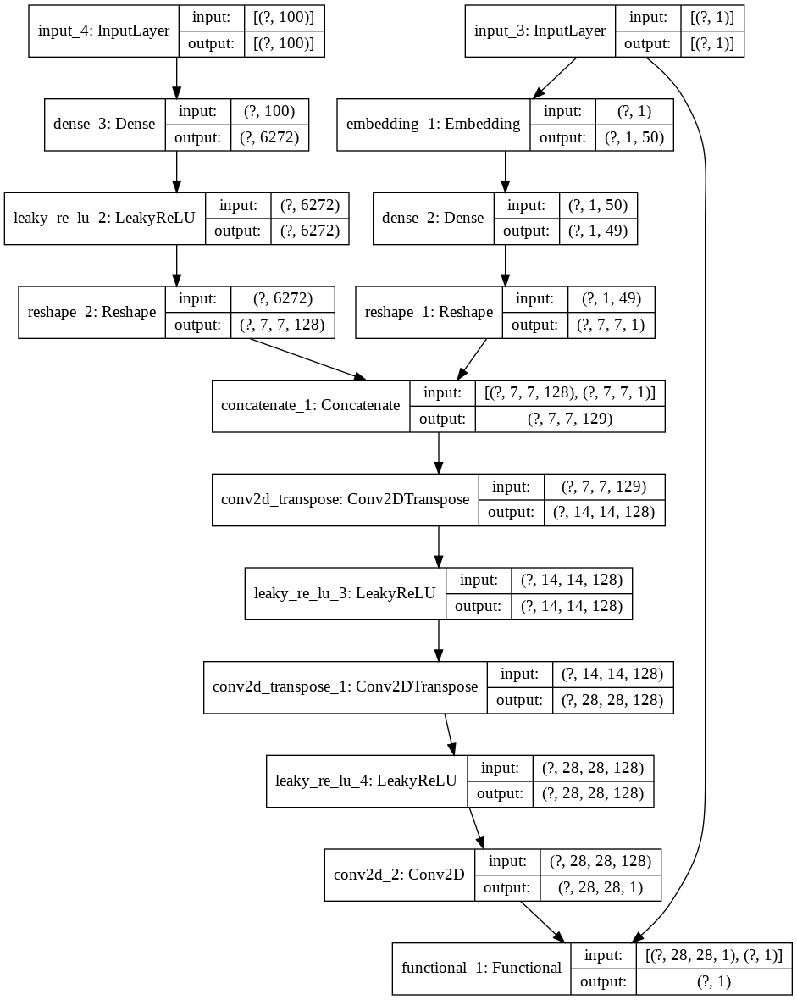

In [20]:
gan = create_gan(generator, discriminator)
gan.summary()
plot_model(gan, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

## Training the model

In [24]:
def train_gan_single_epoch(gan, generator, discriminator, noise_dim, batches, batch_size, image_noise_magnitude, verbose=1):          
    for i in range(batches):
        real_batch_images, real_batch_labels, real_classes = generate_real_batch(prepared_real_images,
                                                                                 real_train_labels, batch_size // 2)
        fake_batch_images, fake_batch_labels, fake_classes = generate_fake_batch(generator, noise_dim, N_CLASSES,
                                                                                 batch_size // 2)

        # Adding noise.
        if image_noise_magnitude > 0:
            real_noise_tensor = np.random.uniform(-1 * image_noise_magnitude, image_noise_magnitude, real_batch_images.shape)
            fake_noise_tensor = np.random.uniform(-1 * image_noise_magnitude, image_noise_magnitude, fake_batch_images.shape)

            real_batch_images = real_batch_images + real_noise_tensor
            fake_batch_images = fake_batch_images + fake_noise_tensor
        
        #Training on batch
        discriminator_real_met = discriminator.train_on_batch([real_batch_images, real_classes], real_batch_labels)
        discriminator_fake_met = discriminator.train_on_batch([fake_batch_images, fake_classes], fake_batch_labels)
        
        
        gan_input_vector, gan_classes = generate_noise_vector(noise_dim, batch_size, N_CLASSES)

        
        gan_labels = np.full(batch_size, REAL_LABEL_VALUE)
        gan_met = gan.train_on_batch([gan_input_vector, gan_classes], gan_labels)
        
        if verbose >= 2: 
            print(f"{i} / {batches}: {discriminator_real_met}, {discriminator_fake_met}, {gan_met}")
            
            if verbose >= 3:
                print("Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)")
                print("Real samples this round...")
                for i in range(10):
                    ax = plt.subplot(2, 5, i+1)
                    ax.axis('off')
                    ax.set_title(f"{real_batch_labels[i]:.2f}, {real_classes[i]}")
                    plt.imshow((real_batch_images[i] + 1) / 2)

                plt.show()

                print("Fake samples this round...")
                for i in range(10):
                    ax = plt.subplot(2, 5, i+1)
                    ax.axis('off')
                    ax.set_title(f"{fake_batch_labels[i]:.2f}, {fake_classes[i]}")
                    plt.imshow(((fake_batch_images[i] + 1) / 2).reshape(INPUT_SHAPE[0], INPUT_SHAPE[1]))

                plt.show()

In [25]:
def train_gan(gan, generator, discriminator, latent_dim, epochs, batches_per_epoch, batch_size, initial_image_noise, verbose=1):
    image_noise_decrement = initial_image_noise / epochs
    image_noise_magnitude = initial_image_noise
    
    if verbose > 0: 
        print(f"Beginning training... {epochs} epochs, each with {batches_per_epoch} batches of {batch_size}")
        print(f"Latent vector size {latent_dim}")
        print(f"Image noise initial magnitude: {image_noise_magnitude}, decay: {image_noise_decrement}")
        print("Training... ")
        print("Metrics: Discriminator Real, Discriminator Fake, Generator")
    
    for i in range(epochs):
        train_gan_single_epoch(gan, generator, discriminator, latent_dim, batches_per_epoch, batch_size, image_noise_magnitude, verbose=verbose)

        
        image_noise_magnitude -= image_noise_decrement


        if verbose >= 1:
            
            fake_images, fake_labels, fake_classes = generate_fake_batch(generator, latent_dim, N_CLASSES, 10) 
            disc_fake_classifications = discriminator.predict([fake_images, fake_classes])
            fake_images = (fake_images + 1) / 2 
            print(f'After {(i+1)*BATCHES*BATCH_SIZE} samples.')
            print('Image labels are D(image) and Class(image)')
            print('  Generated Images and Discriminator Output:')
            for i in range(10):
                ax = plt.subplot(2, 5, i+1)
                ax.axis('off')
                ax.set_title(f'{disc_fake_classifications[i][0]:.2f}, {fake_classes[i]}')
                plt.imshow(fake_images[i].reshape(INPUT_SHAPE[0], INPUT_SHAPE[1]))

            plt.tight_layout()
            plt.show()
            
            
            print('  Real Images and Discriminator Output:')
            real_images, real_batch_labels, real_classes = generate_real_batch(prepared_real_images, real_train_labels, 10)
            disc_real_classifications = discriminator.predict([real_images, real_classes])
            real_images = (real_images + 1) / 2 
            for i in range(10):
                ax = plt.subplot(2, 5, i+1)
                ax.axis('off')
                ax.set_title(f"{disc_real_classifications[i][0]:.2f} {real_classes[i]}")
                plt.imshow(real_images[i])

            plt.tight_layout()
            plt.show()

Beginning training... 1 epochs, each with 3 batches of 128
Latent vector size 100
Image noise initial magnitude: 0.1, decay: 0.1
Training... 
Metrics: Discriminator Real, Discriminator Fake, Generator
0 / 3: [0.7159181833267212, 0.3125], [0.6971006393432617, 0.0625], [0.6909048557281494, 0.9765625]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


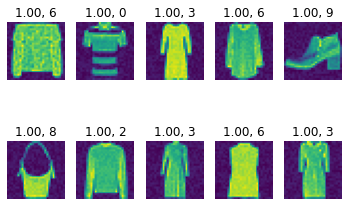

Fake samples this round...


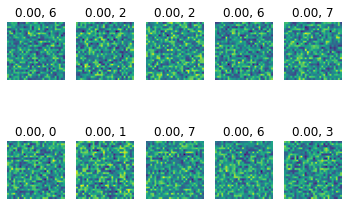

1 / 3: [0.6340348720550537, 0.984375], [0.7001327276229858, 0.046875], [0.6877157092094421, 1.0]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


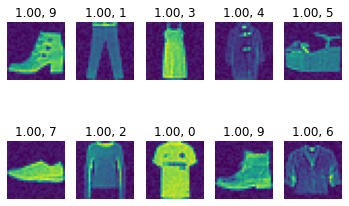

Fake samples this round...


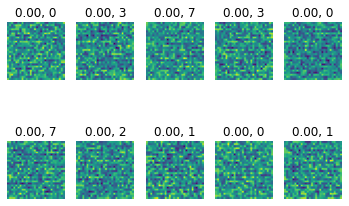

2 / 3: [0.5687057971954346, 1.0], [0.7076364755630493, 0.0], [0.6810106039047241, 1.0]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


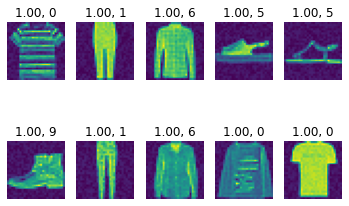

Fake samples this round...


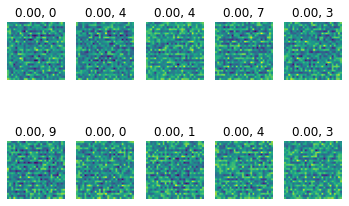

After 384 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


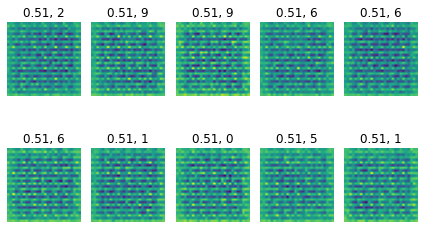

  Real Images and Discriminator Output:


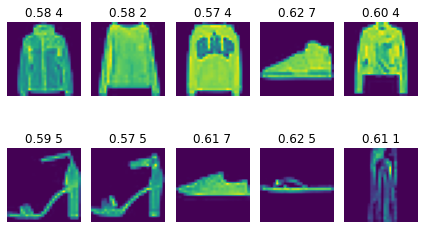

In [26]:
EPOCHS = 1
BATCHES = 3
BATCH_SIZE = 128
IMAGE_NOISE_START = .1


#Avoiding some warnings
import logging
logger = logging.getLogger()
old_level = logger.level
logger.setLevel(100)

#initial training
train_gan(gan, generator, discriminator, NOISE_DIM, EPOCHS, BATCHES, BATCH_SIZE, IMAGE_NOISE_START, verbose=3)    

logger.setLevel(old_level)

In [ ]:
EPOCHS = 50
BATCHES = 100
BATCH_SIZE = 128
IMAGE_NOISE_START = .1
LABEL_SMOOTHING_MAGNITUDE = .1

#more training for 50 epochs
discriminator = create_discriminator(INPUT_SHAPE, N_CLASSES, label_smoothing = LABEL_SMOOTHING_MAGNITUDE)
generator = create_generator(NOISE_DIM, LATENT_DENSE_SIZE, N_CLASSES)
gan = create_gan(generator, discriminator, label_smoothing = LABEL_SMOOTHING_MAGNITUDE)

train_gan(
    gan,
    generator,
    discriminator,
    NOISE_DIM,
    EPOCHS,
    BATCHES,
    BATCH_SIZE,
    IMAGE_NOISE_START,
    verbose=2
)

Beginning training... 100 epochs, each with 200 batches of 128
Latent vector size 100
Image noise initial magnitude: 0.05, decay: 0.0005
Training... 
Metrics: Discriminator Real, Discriminator Fake, Generator
After 12800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


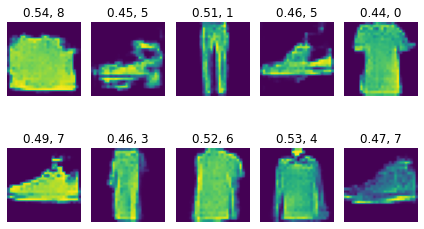

  Real Images and Discriminator Output:


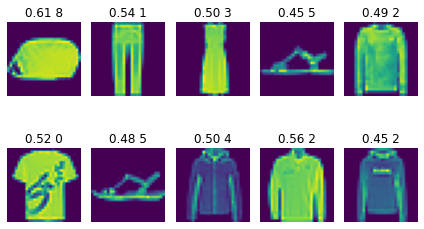

After 25600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


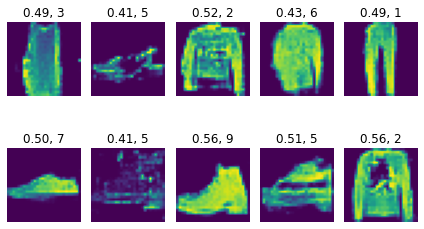

  Real Images and Discriminator Output:


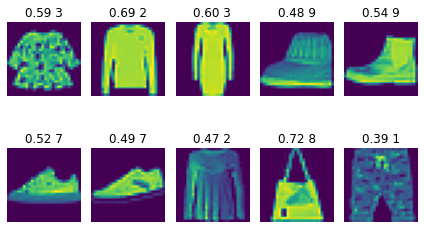

After 38400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


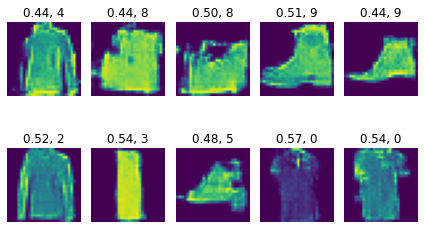

  Real Images and Discriminator Output:


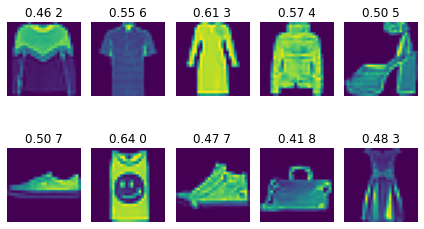

After 51200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


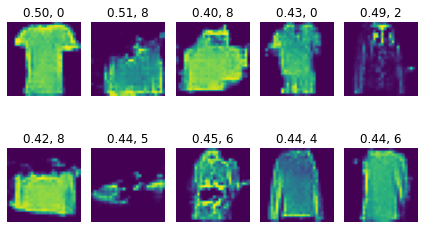

  Real Images and Discriminator Output:


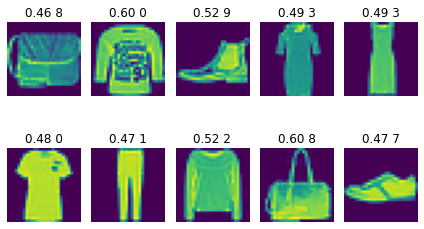

After 64000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


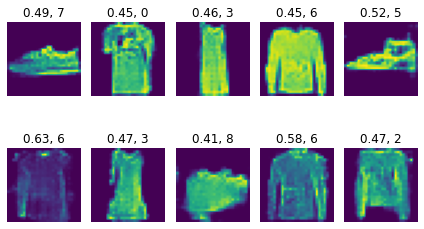

  Real Images and Discriminator Output:


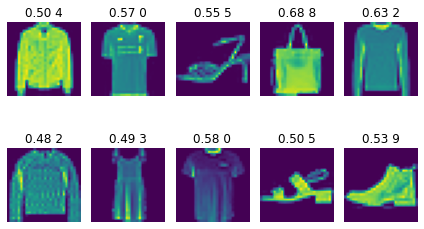

After 76800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


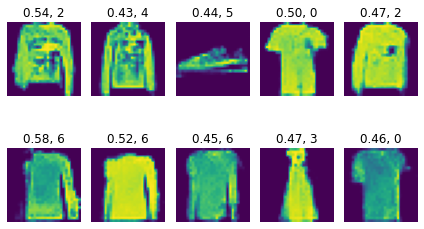

  Real Images and Discriminator Output:


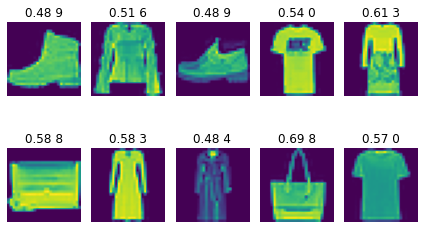

After 89600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


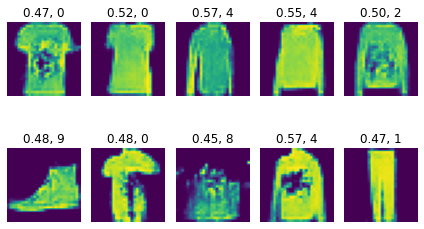

  Real Images and Discriminator Output:


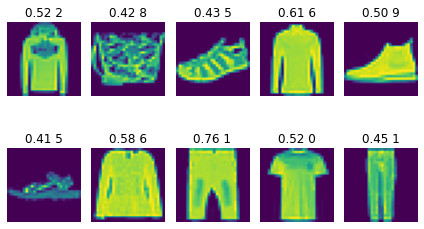

After 102400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


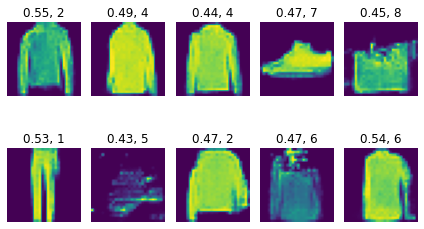

  Real Images and Discriminator Output:


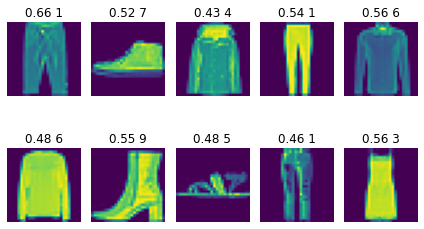

After 115200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


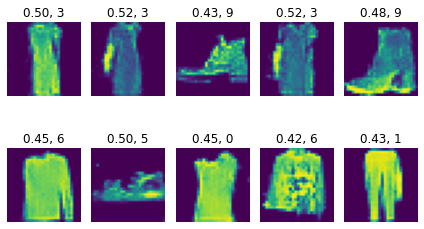

  Real Images and Discriminator Output:


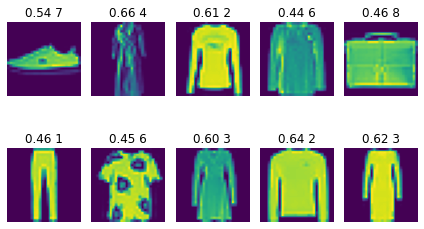

After 128000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


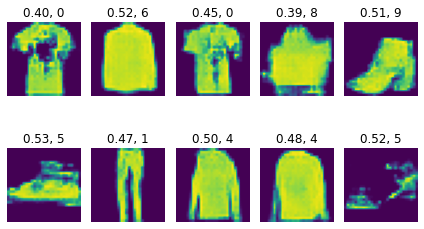

  Real Images and Discriminator Output:


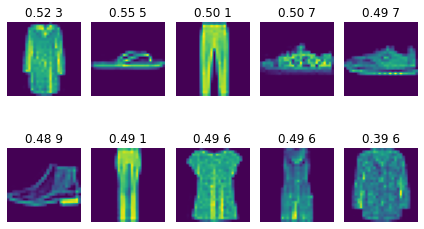

After 140800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


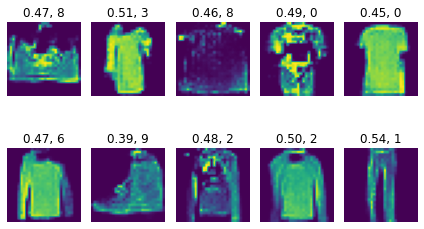

  Real Images and Discriminator Output:


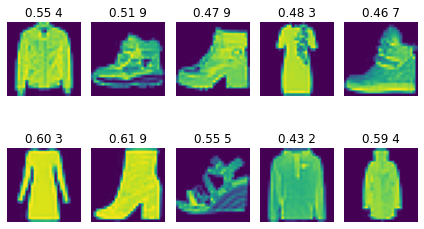

After 153600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


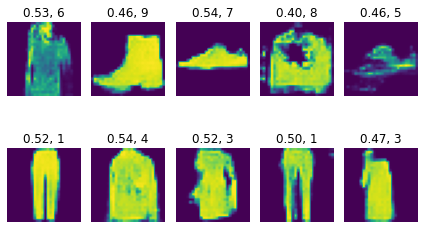

  Real Images and Discriminator Output:


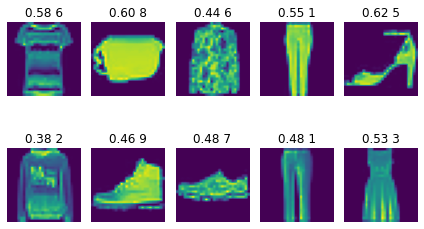

After 166400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


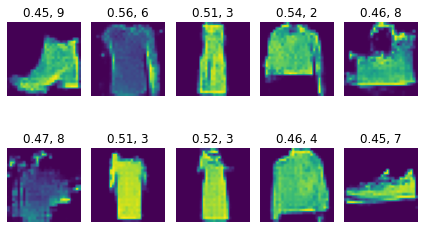

  Real Images and Discriminator Output:


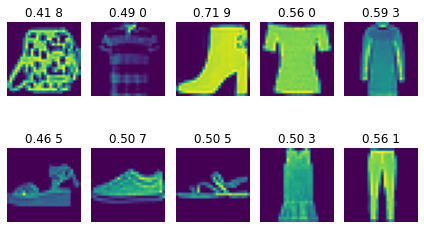

After 179200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


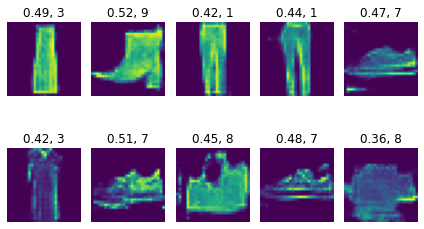

  Real Images and Discriminator Output:


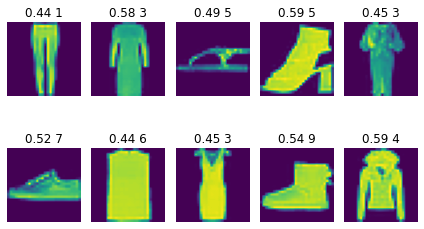

After 192000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


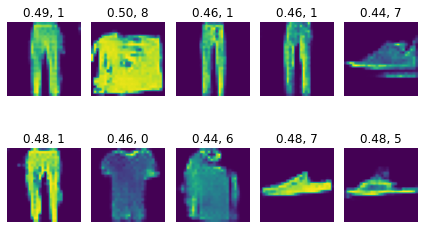

  Real Images and Discriminator Output:


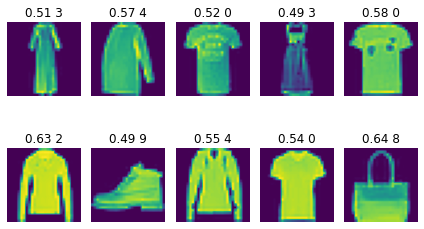

After 204800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


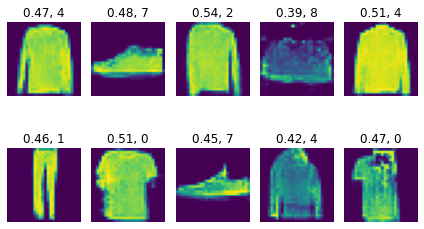

  Real Images and Discriminator Output:


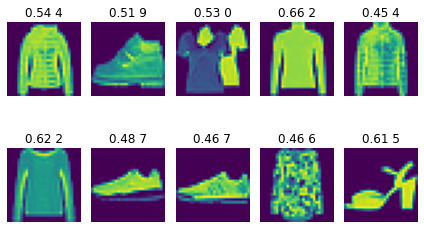

After 217600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


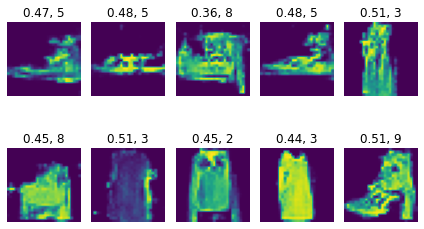

  Real Images and Discriminator Output:


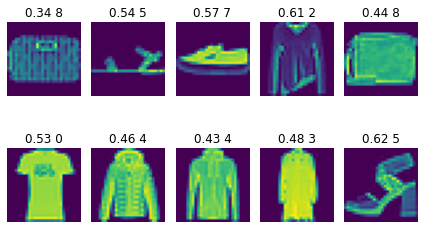

After 230400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


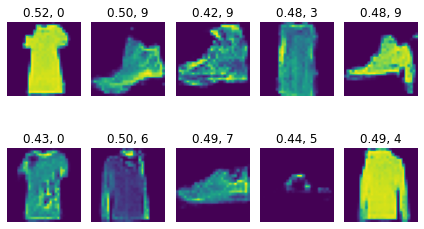

  Real Images and Discriminator Output:


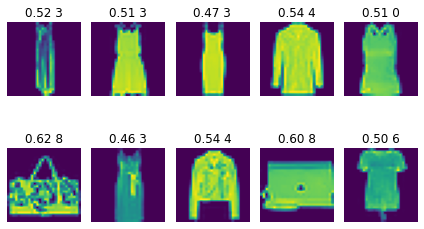

After 243200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


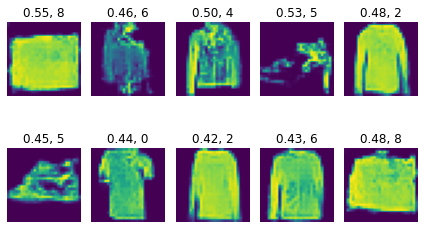

  Real Images and Discriminator Output:


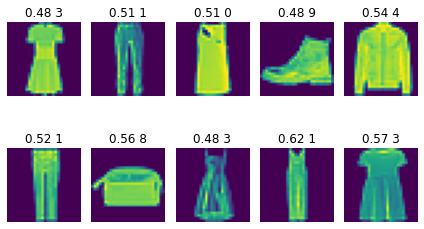

After 256000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


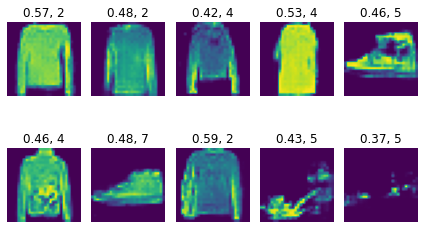

  Real Images and Discriminator Output:


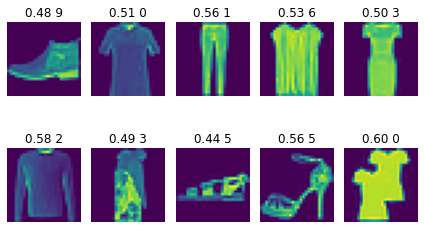

After 268800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


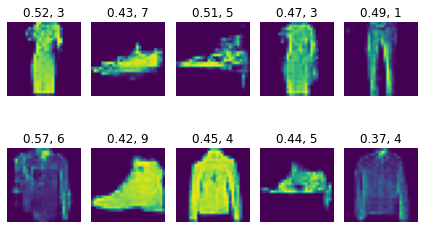

  Real Images and Discriminator Output:


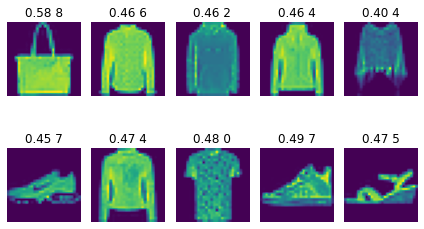

After 281600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


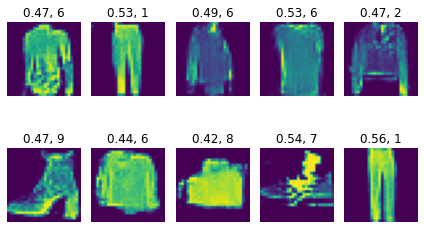

  Real Images and Discriminator Output:


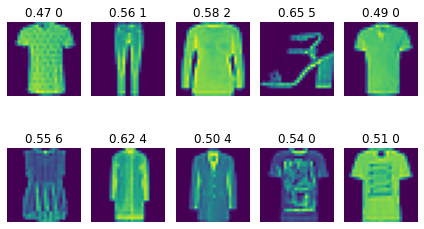

After 294400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


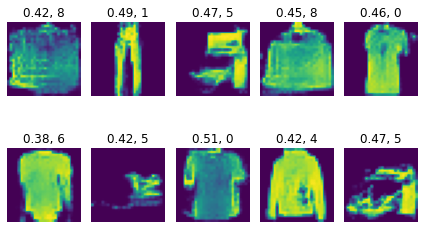

  Real Images and Discriminator Output:


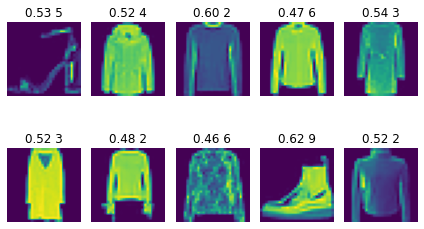

After 307200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


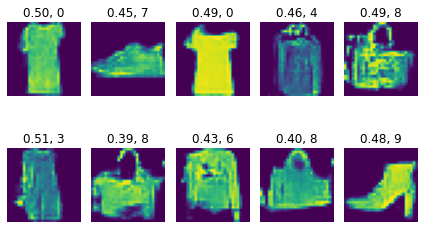

  Real Images and Discriminator Output:


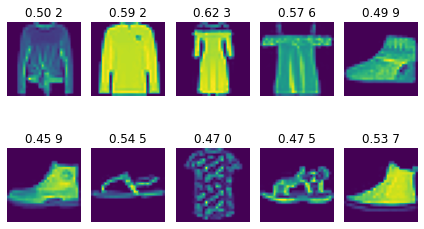

After 320000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


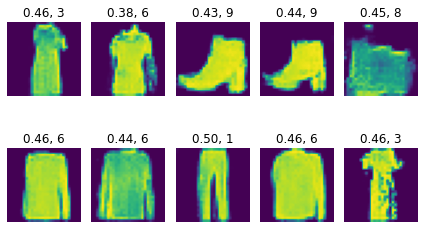

  Real Images and Discriminator Output:


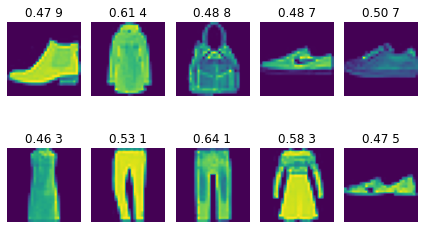

After 332800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


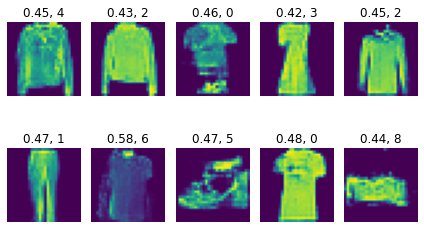

  Real Images and Discriminator Output:


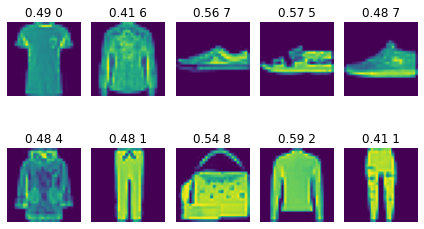

After 345600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


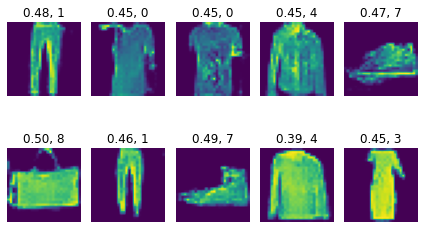

  Real Images and Discriminator Output:


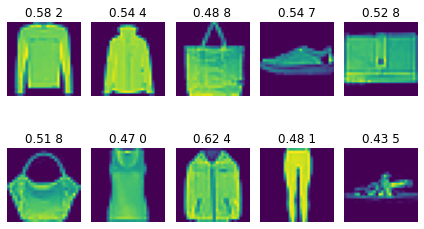

After 358400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


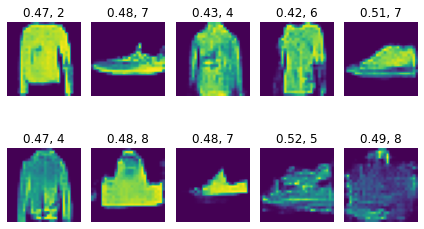

  Real Images and Discriminator Output:


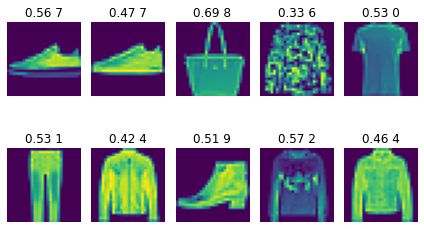

After 371200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


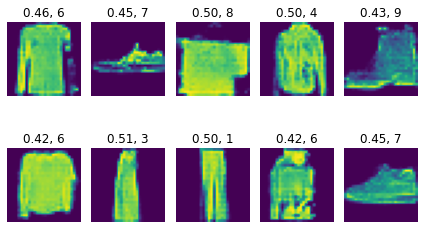

  Real Images and Discriminator Output:


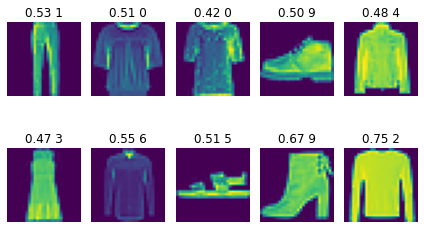

After 384000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


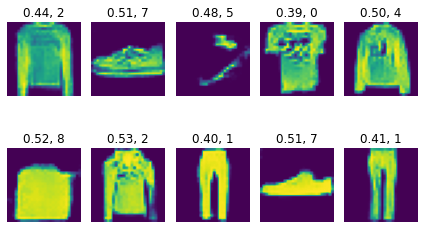

  Real Images and Discriminator Output:


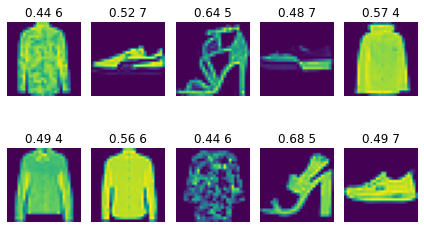

After 396800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


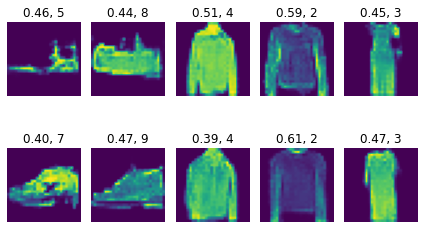

  Real Images and Discriminator Output:


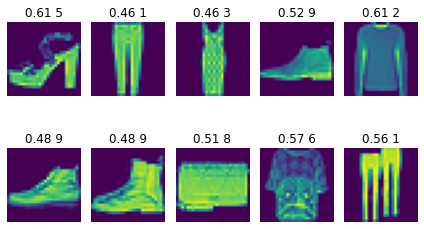

After 409600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


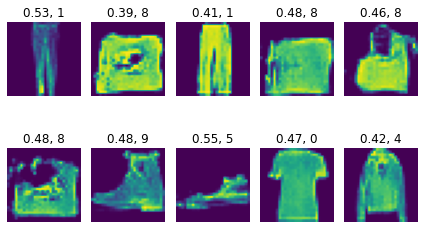

  Real Images and Discriminator Output:


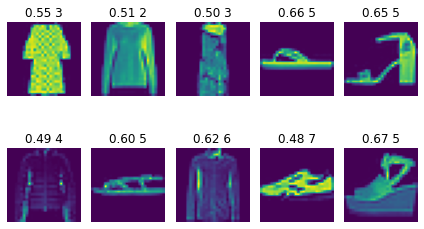

After 422400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


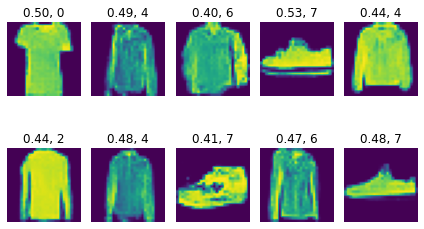

  Real Images and Discriminator Output:


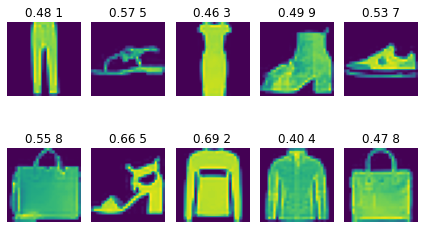

After 435200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


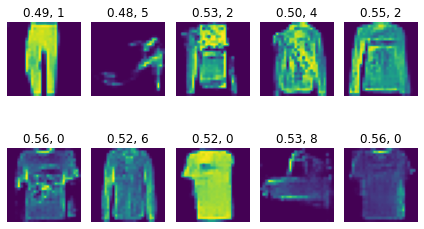

  Real Images and Discriminator Output:


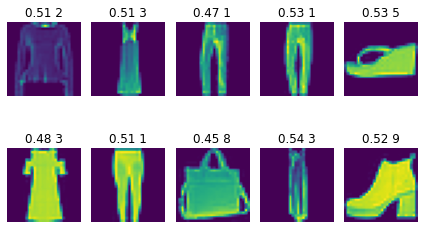

After 448000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


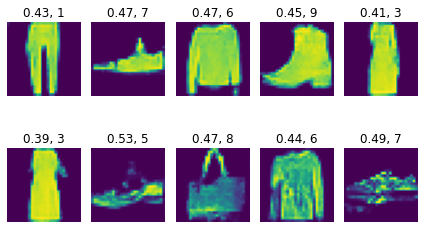

  Real Images and Discriminator Output:


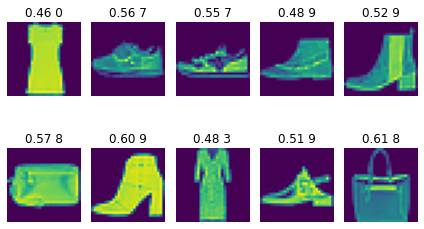

After 460800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


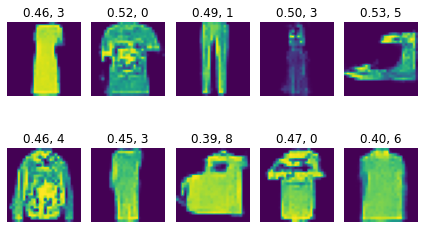

  Real Images and Discriminator Output:


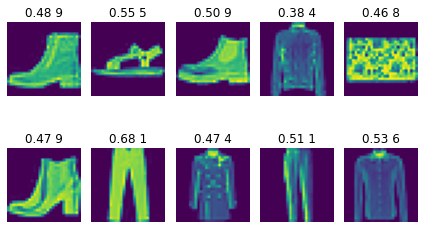

After 473600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


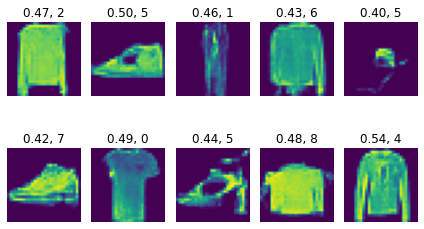

  Real Images and Discriminator Output:


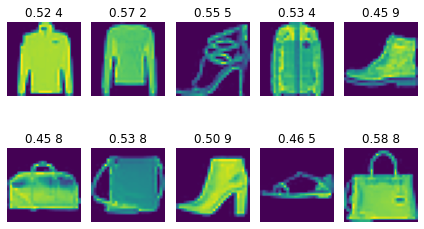

After 486400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


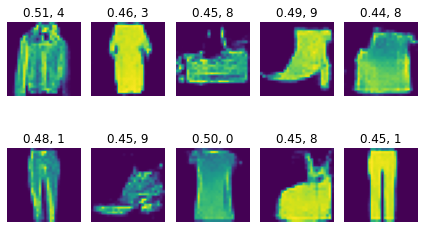

  Real Images and Discriminator Output:


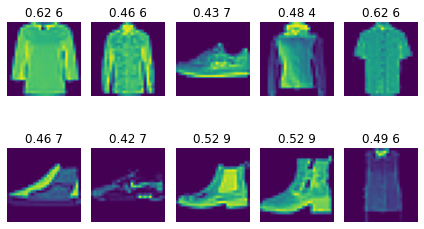

After 499200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


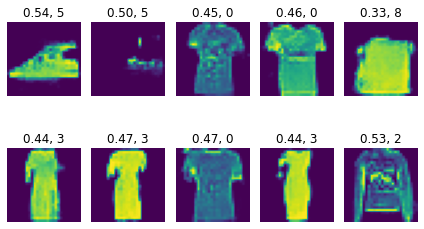

  Real Images and Discriminator Output:


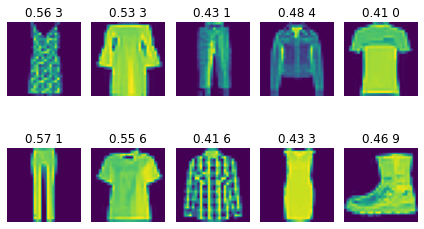

After 512000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


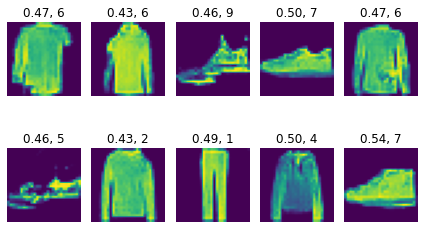

  Real Images and Discriminator Output:


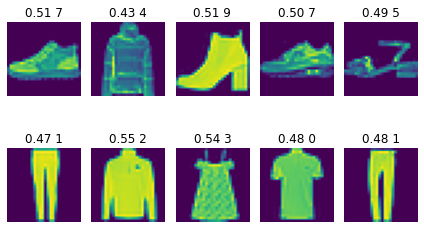

After 524800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


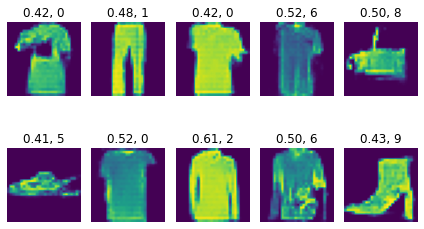

  Real Images and Discriminator Output:


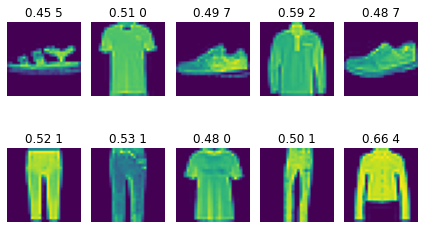

After 537600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


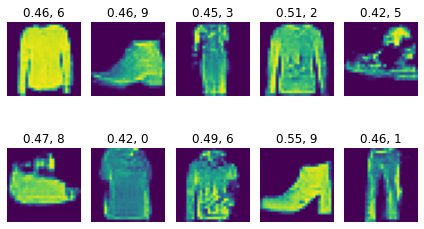

  Real Images and Discriminator Output:


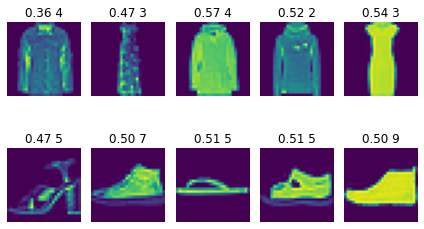

After 550400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


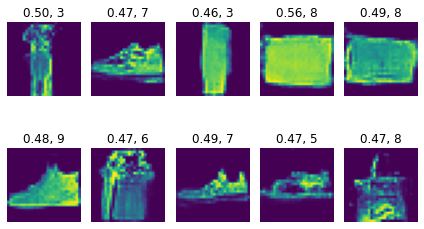

  Real Images and Discriminator Output:


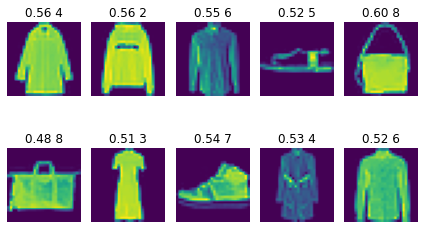

After 563200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


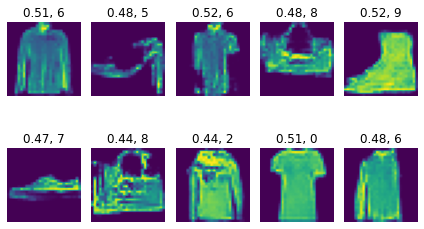

  Real Images and Discriminator Output:


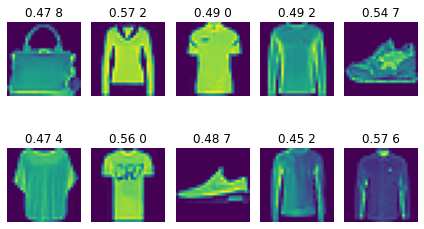

After 576000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


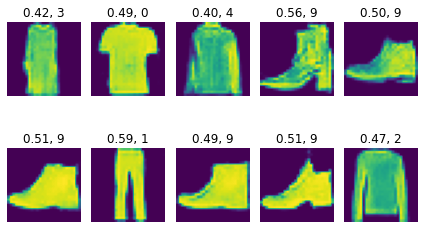

  Real Images and Discriminator Output:


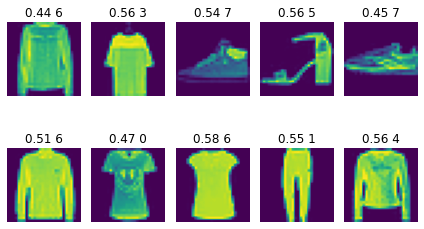

After 588800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


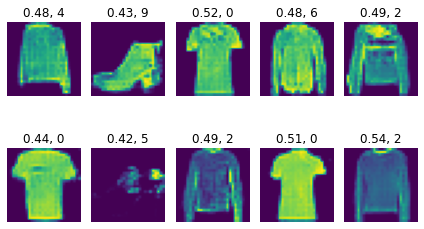

  Real Images and Discriminator Output:


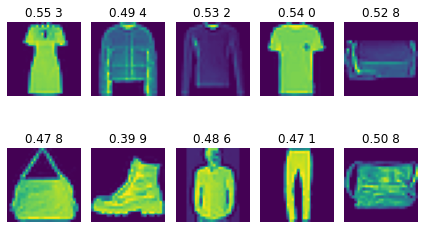

After 601600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


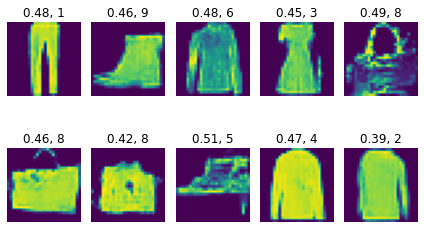

  Real Images and Discriminator Output:


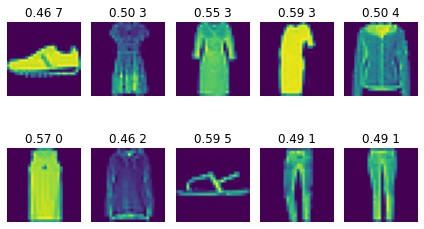

After 614400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


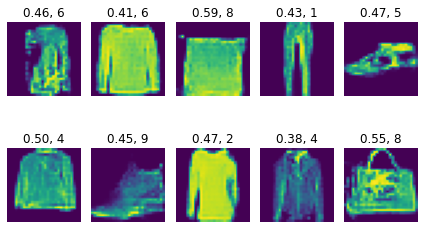

  Real Images and Discriminator Output:


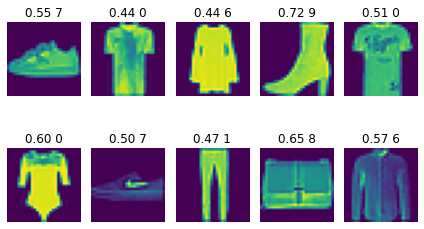

After 627200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


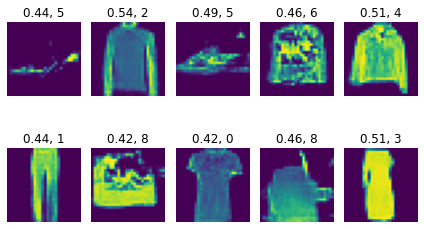

  Real Images and Discriminator Output:


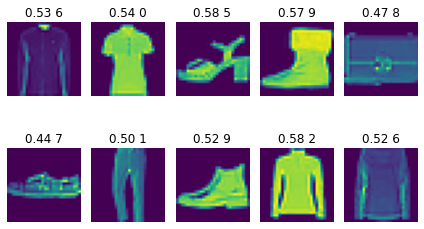

After 640000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


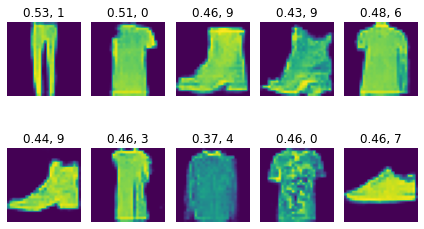

  Real Images and Discriminator Output:


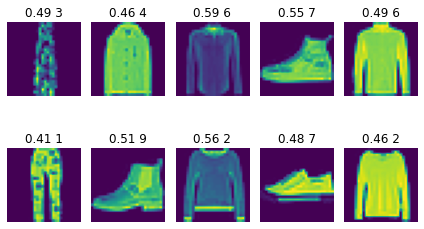

After 652800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


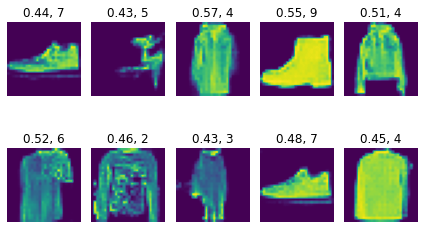

  Real Images and Discriminator Output:


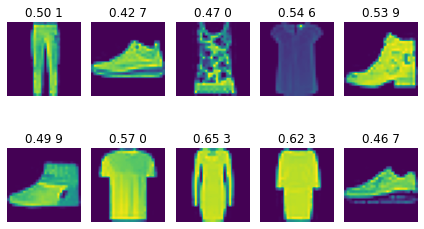

After 665600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


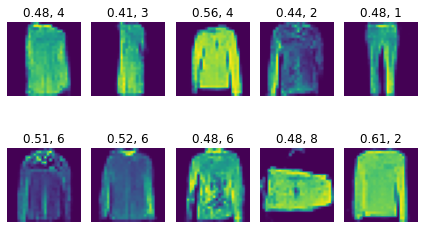

  Real Images and Discriminator Output:


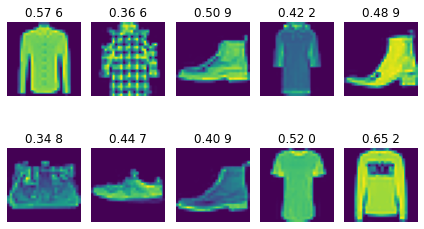

After 678400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


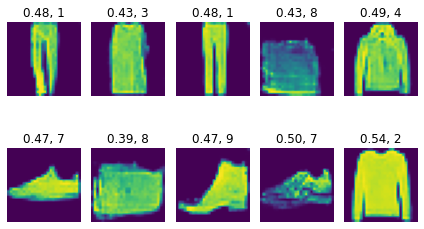

  Real Images and Discriminator Output:


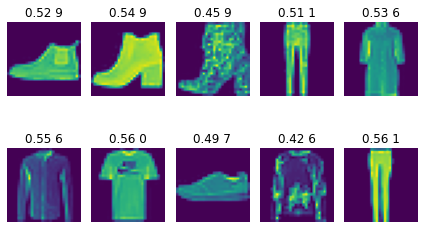

After 691200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


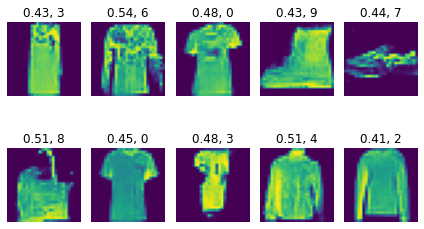

  Real Images and Discriminator Output:


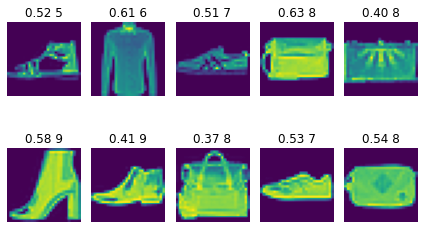

After 704000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


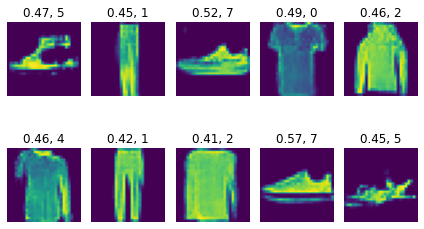

  Real Images and Discriminator Output:


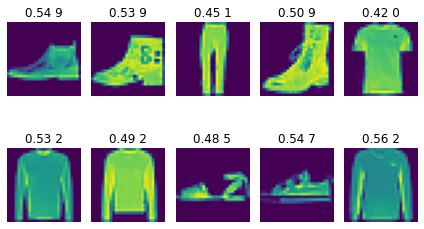

After 716800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


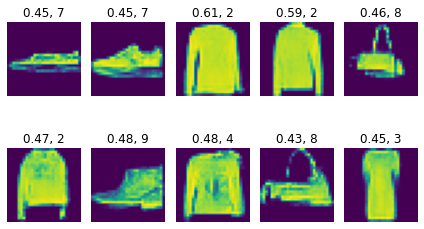

  Real Images and Discriminator Output:


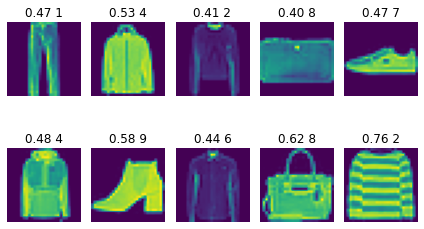

After 729600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


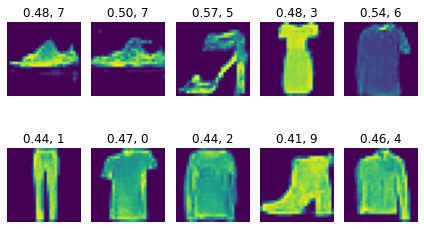

  Real Images and Discriminator Output:


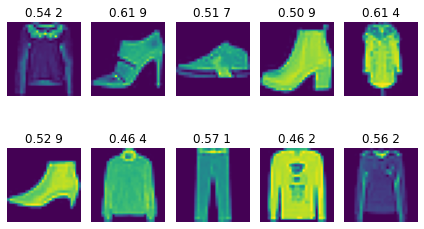

After 742400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


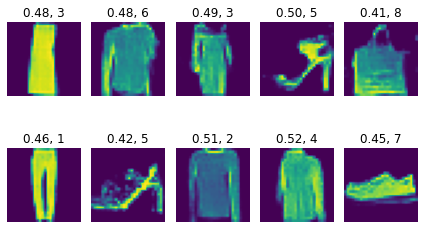

  Real Images and Discriminator Output:


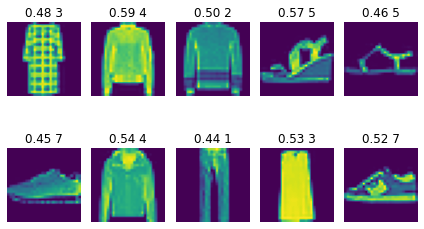

After 755200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


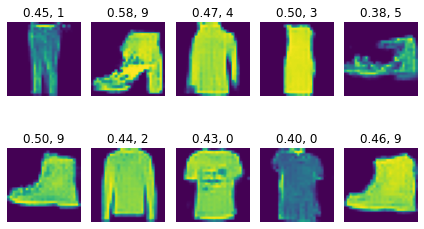

  Real Images and Discriminator Output:


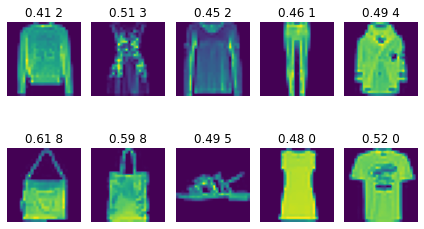

After 768000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


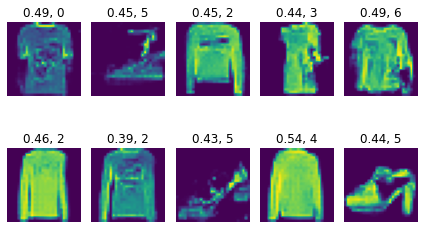

  Real Images and Discriminator Output:


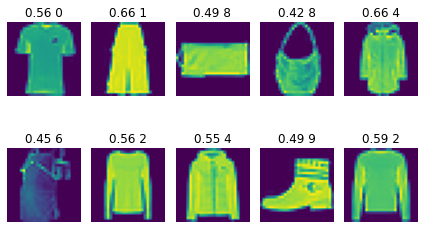

After 780800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


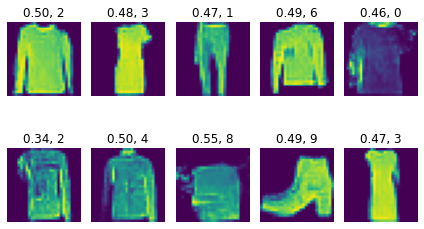

  Real Images and Discriminator Output:


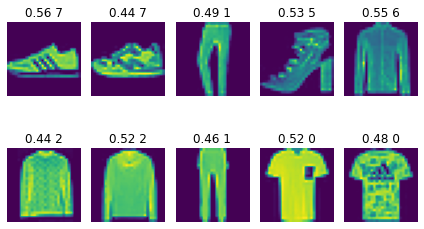

After 793600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


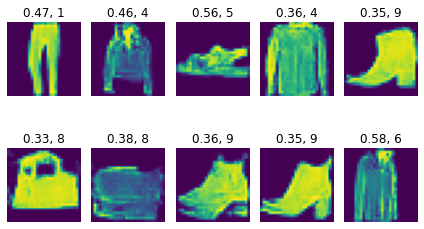

  Real Images and Discriminator Output:


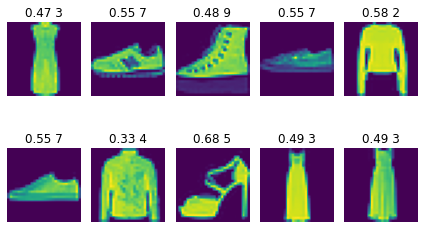

After 806400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


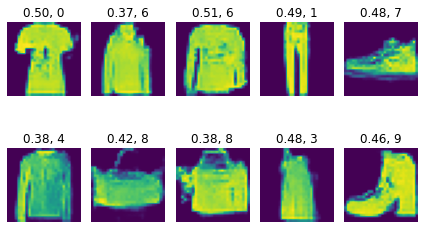

  Real Images and Discriminator Output:


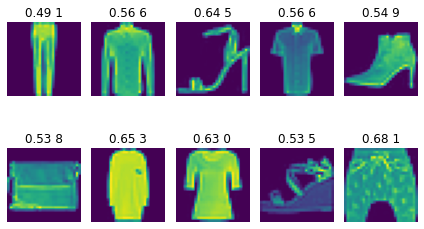

After 819200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


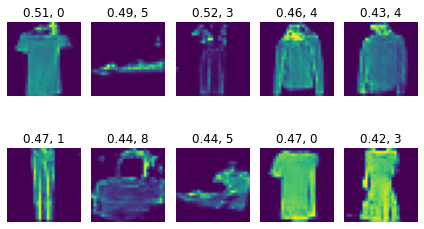

  Real Images and Discriminator Output:


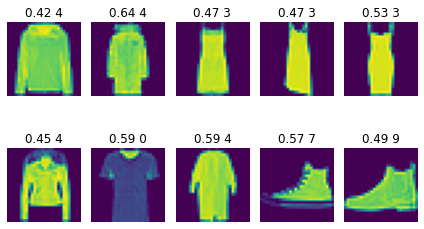

After 832000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


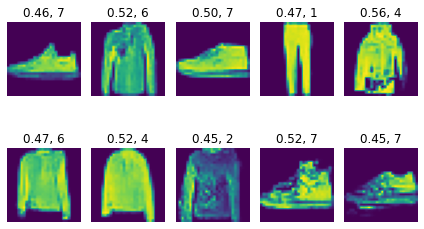

  Real Images and Discriminator Output:


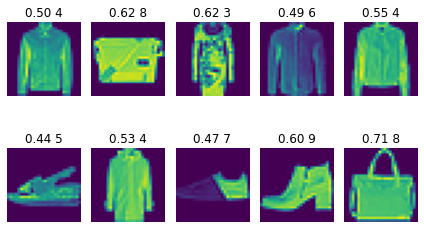

After 844800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


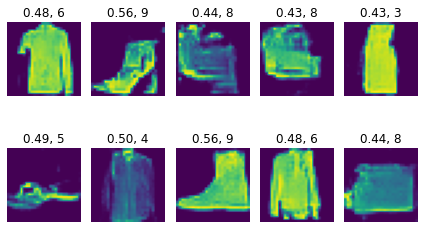

  Real Images and Discriminator Output:


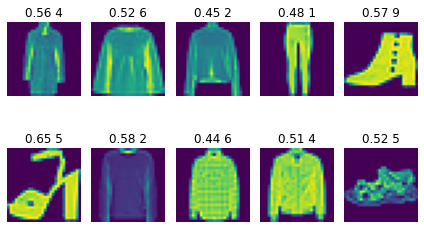

After 857600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


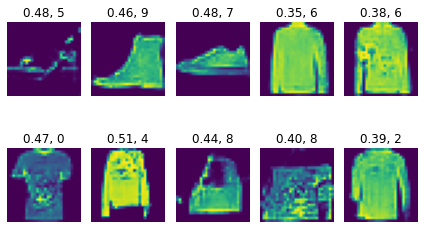

  Real Images and Discriminator Output:


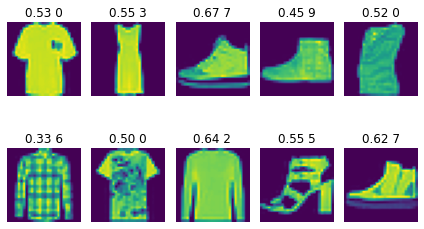

After 870400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


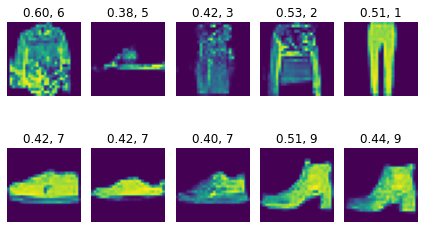

  Real Images and Discriminator Output:


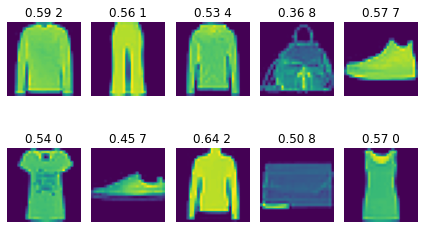

After 883200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


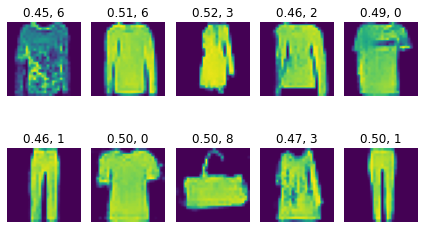

  Real Images and Discriminator Output:


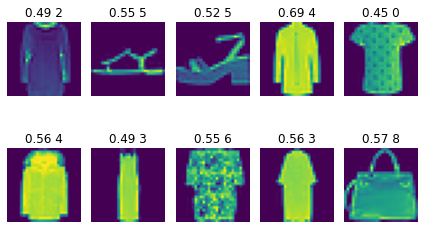

After 896000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


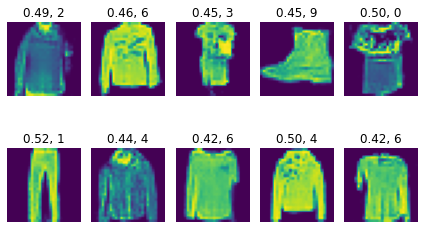

  Real Images and Discriminator Output:


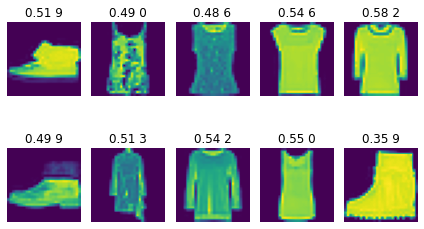

After 908800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


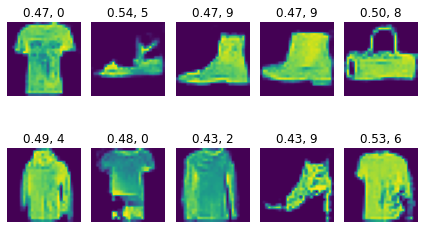

  Real Images and Discriminator Output:


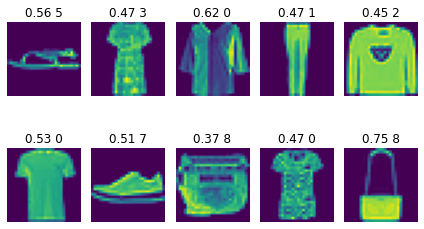

After 921600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


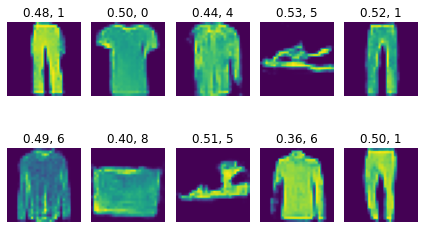

  Real Images and Discriminator Output:


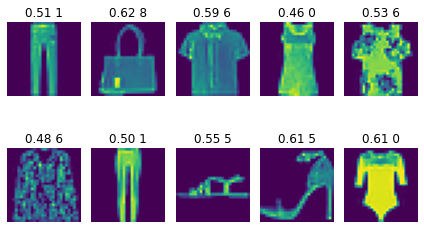

After 934400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


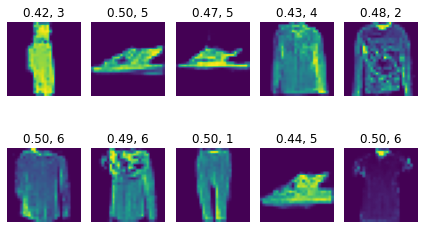

  Real Images and Discriminator Output:


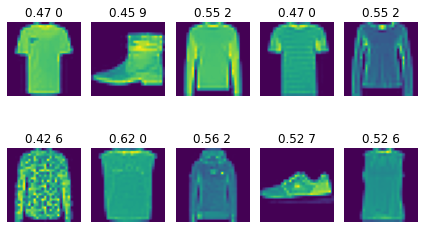

After 947200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


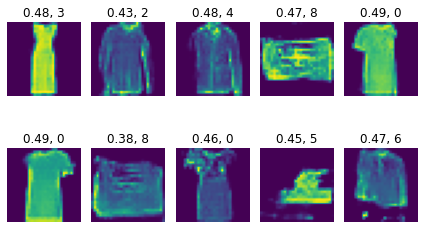

  Real Images and Discriminator Output:


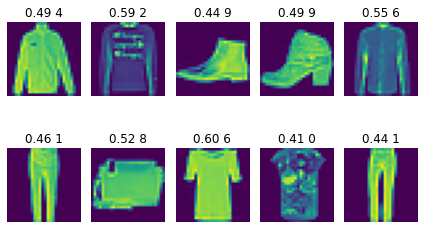

After 960000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


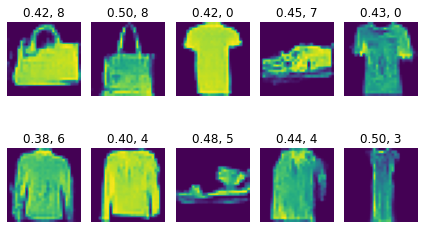

  Real Images and Discriminator Output:


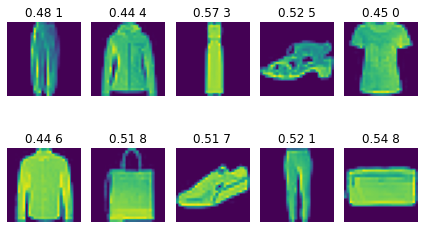

After 972800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


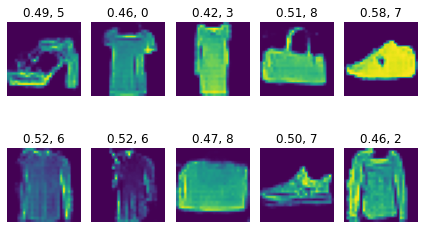

  Real Images and Discriminator Output:


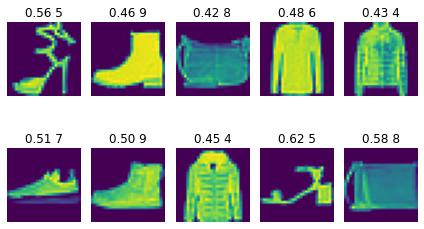

After 985600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


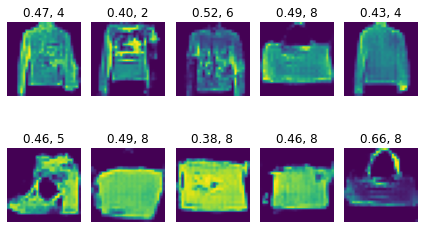

  Real Images and Discriminator Output:


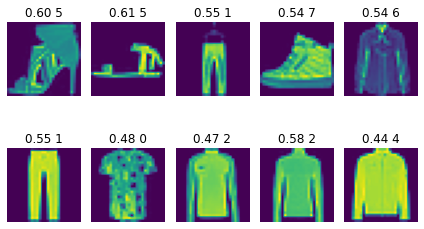

After 998400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


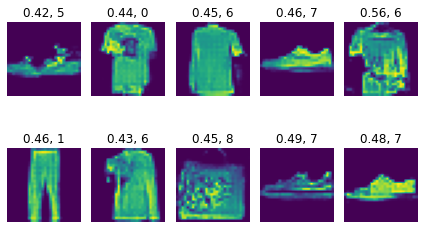

  Real Images and Discriminator Output:


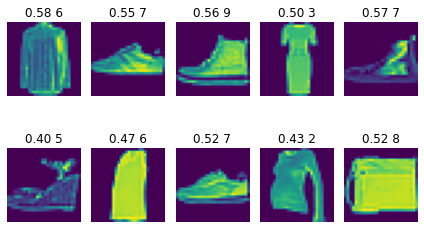

After 1011200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


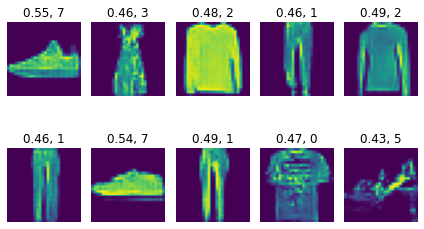

  Real Images and Discriminator Output:


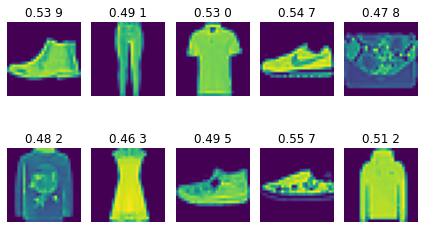

After 1024000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


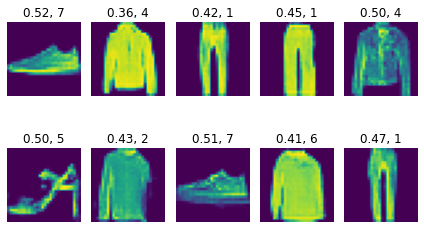

  Real Images and Discriminator Output:


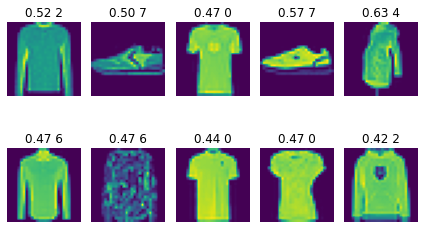

After 1036800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


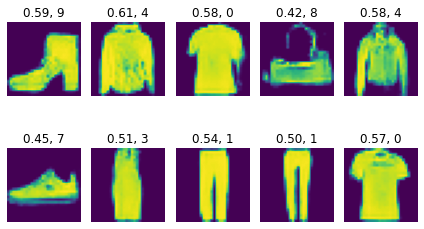

  Real Images and Discriminator Output:


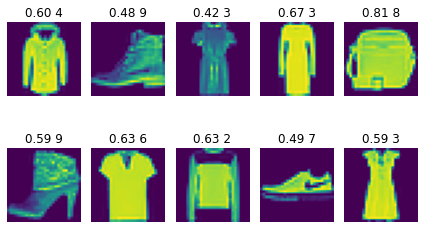

After 1049600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


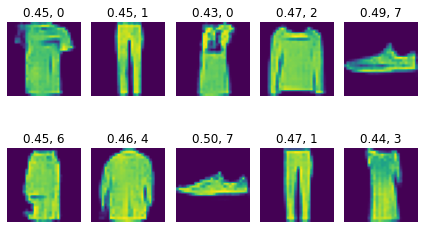

  Real Images and Discriminator Output:


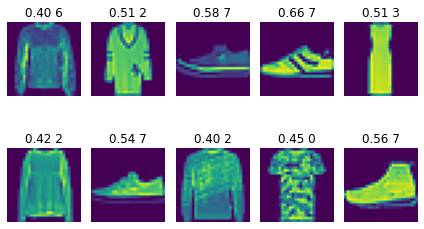

After 1062400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


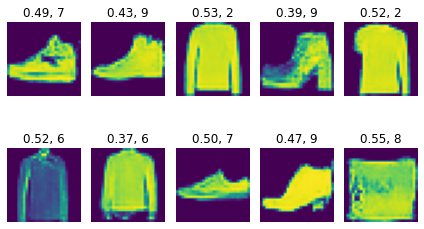

  Real Images and Discriminator Output:


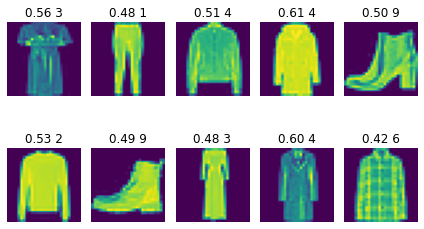

After 1075200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


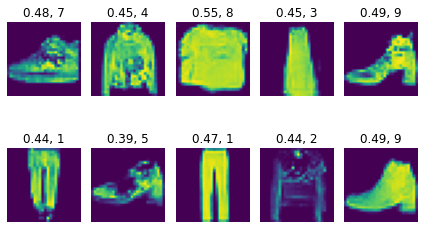

  Real Images and Discriminator Output:


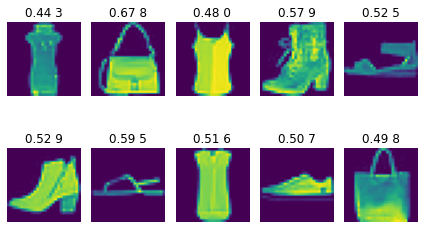

After 1088000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


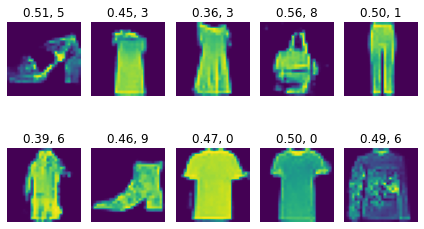

  Real Images and Discriminator Output:


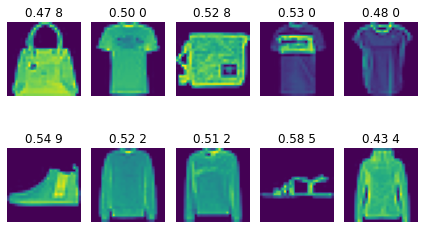

After 1100800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


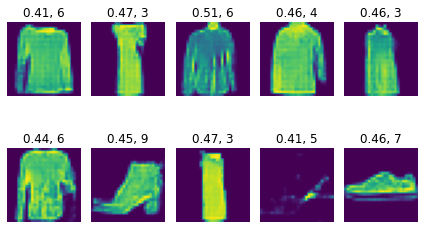

  Real Images and Discriminator Output:


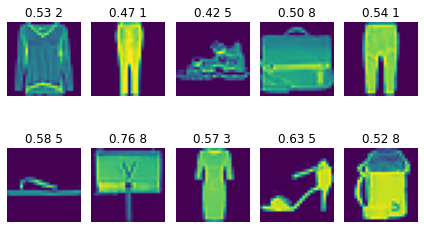

After 1113600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


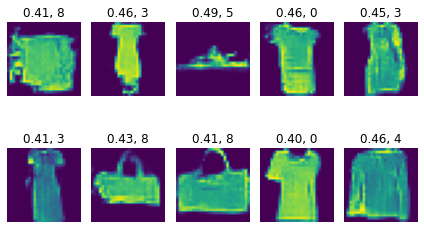

  Real Images and Discriminator Output:


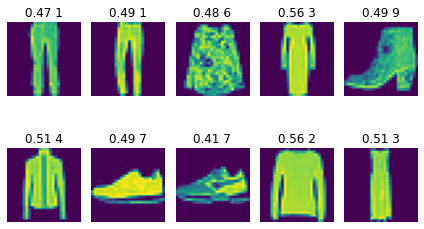

After 1126400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


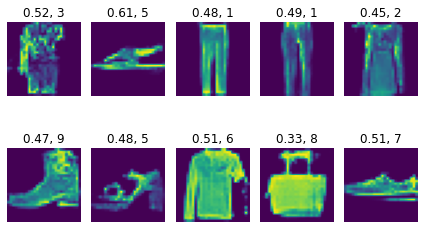

  Real Images and Discriminator Output:


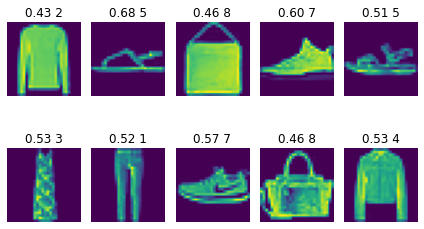

After 1139200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


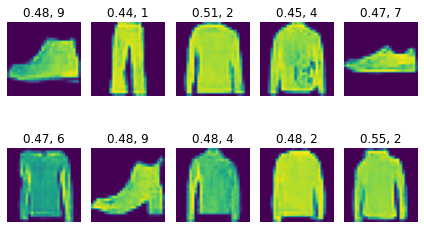

  Real Images and Discriminator Output:


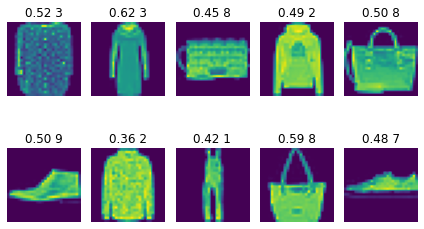

After 1152000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


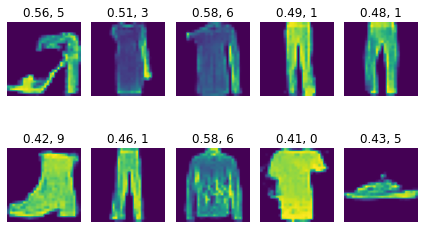

  Real Images and Discriminator Output:


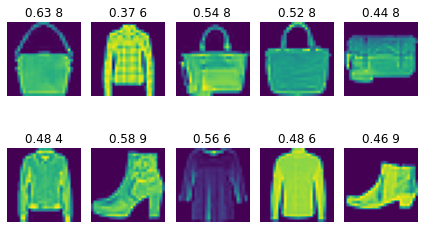

After 1164800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


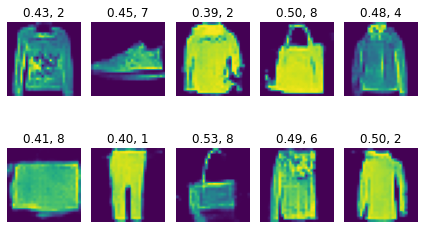

  Real Images and Discriminator Output:


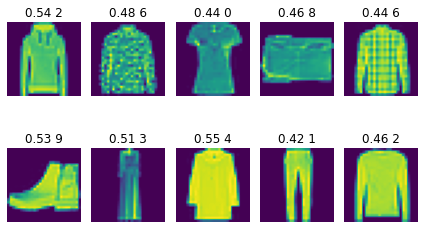

After 1177600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


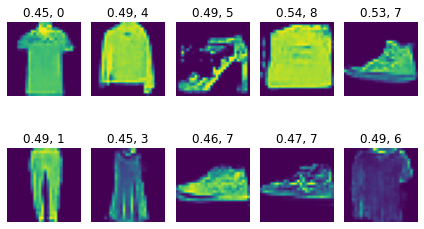

  Real Images and Discriminator Output:


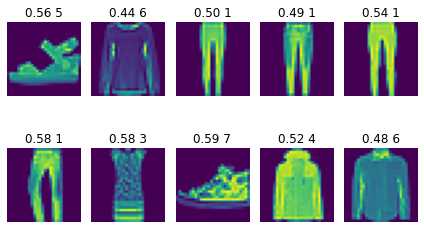

After 1190400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


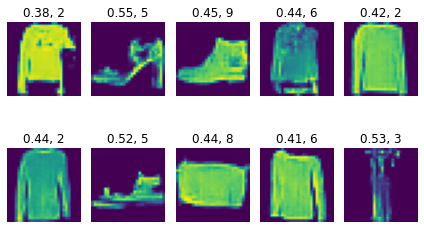

  Real Images and Discriminator Output:


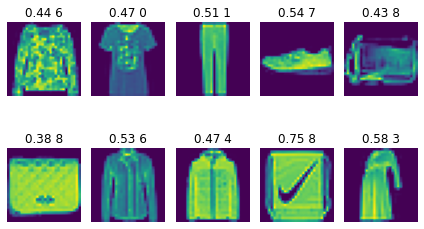

After 1203200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


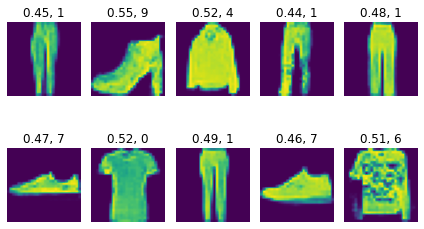

  Real Images and Discriminator Output:


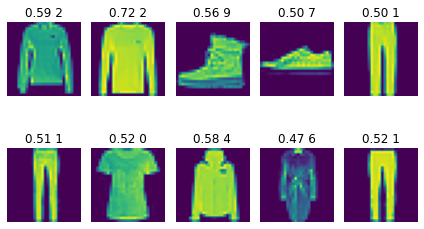

After 1216000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


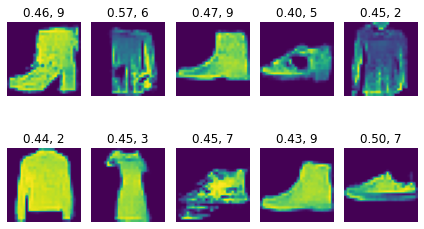

  Real Images and Discriminator Output:


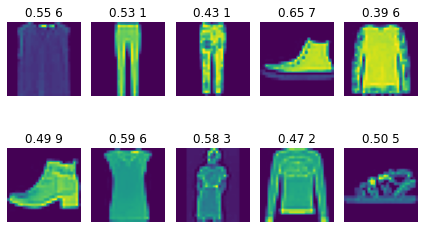

After 1228800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


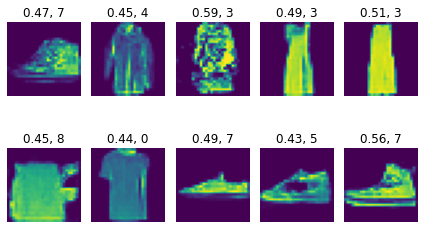

  Real Images and Discriminator Output:


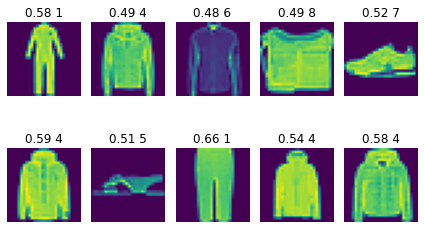

After 1241600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


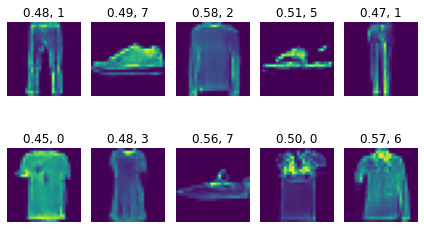

  Real Images and Discriminator Output:


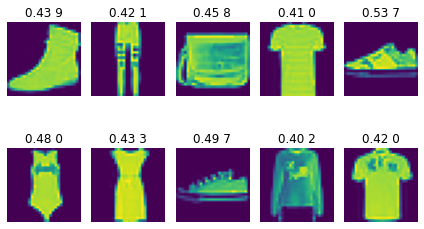

After 1254400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


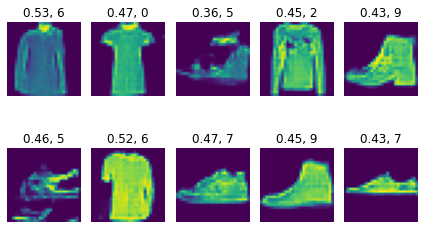

  Real Images and Discriminator Output:


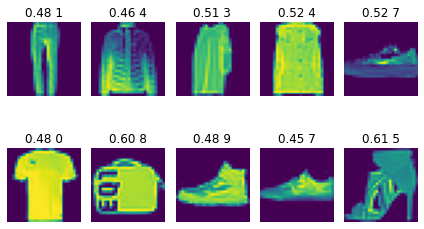

After 1267200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


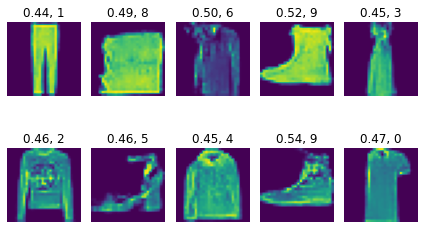

  Real Images and Discriminator Output:


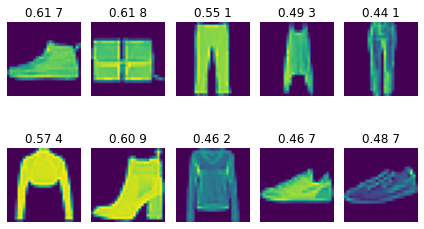

After 1280000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


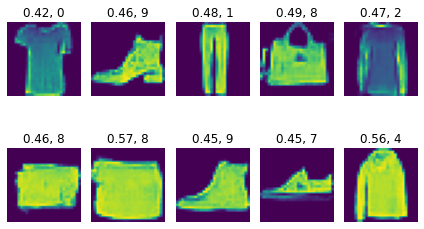

  Real Images and Discriminator Output:


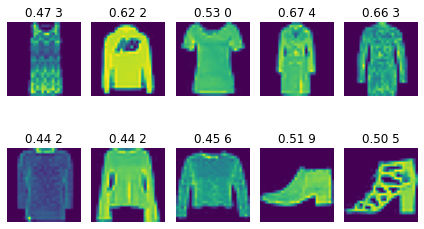

In [28]:
#training for another 100 epochs
train_gan(
    gan,
    generator,
    discriminator,
    NOISE_DIM,
    100,
    200,
    128,
    .05,
    verbose=1
)

saving the model

In [ ]:
save_model(generator, 'cgan_model.h5')

In [4]:
model = load_model('cgan_model.h5')

## Testing the model

The images is organised according to different categories. These are the images produced by the generator.

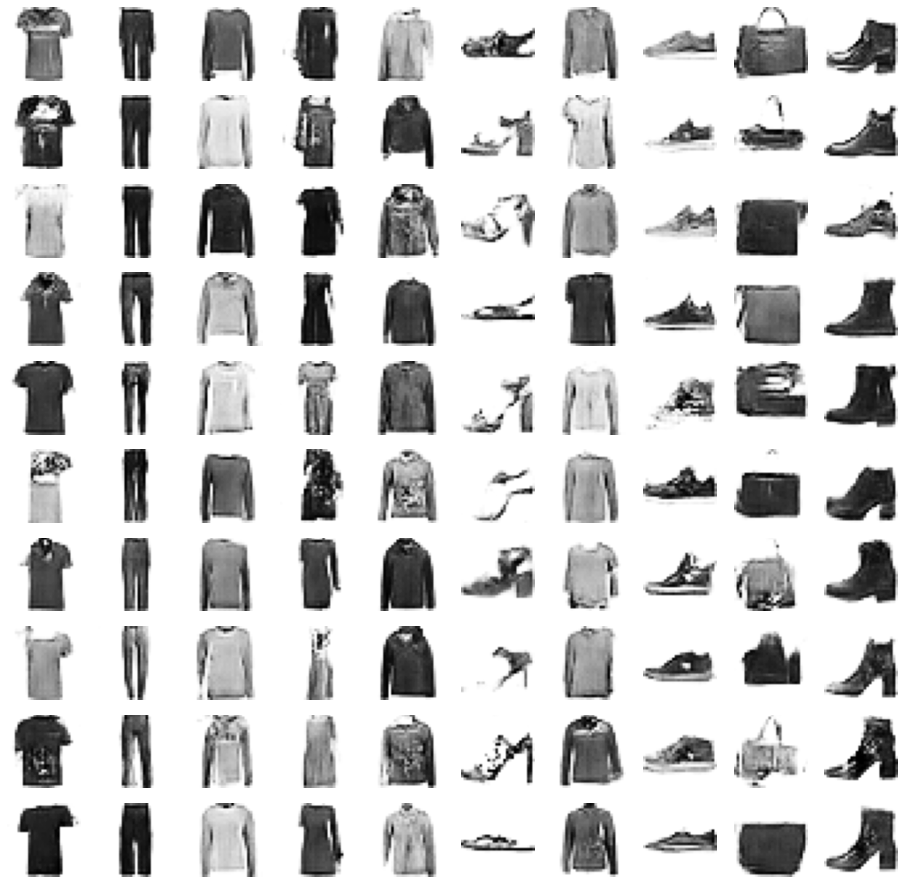

In [5]:
fig = plt.figure()
fig.set_size_inches(16, 16)

#display images
def plot(examples, n):
    for i in range(n * n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i, :, :, 0], cmap='gray_r')
    plt.show()

#generate random noise and labels
latent_points, labels = generate_noise_vector(100, 100, 10)
#generating labels according to the category
labels = np.asarray([x for _ in range(10) for x in range(10)])
#predicting
X  = model.predict([latent_points, labels])
#rescaling the predicted image from [-1, 1] to [0, 1]
X = (X + 1) / 2.0
# plot the result
plot(X, 10)